In [298]:
#Import all relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from scipy.stats import zscore
 
%matplotlib inline

## Loading the data
We can now load the dataset into pandas using the read_csv() function. This converts the CSV file into a Pandas dataframe.

In [299]:
df = pd.read_csv("final_data.csv")

### Viewing the dataframe
We can get a quick sense of the size of our dataset by using the shape method. This returns a tuple with the number of rows and columns in the dataset.

In [300]:
df.head()

,player,team,name,position,height,age,appearance,goals,assists,yellow cards,...,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,winger
0,/david-de-gea/profil/spieler/59377,Manchester United,David de Gea,Goalkeeper,189.0,32.0,104,0.000000,0.000000,0.009585,...,1.217252,0.335463,9390,42,5,13,15000000,70000000,1,0
1,/jack-butland/profil/spieler/128899,Manchester United,Jack Butland,Goalkeeper,196.0,30.0,15,0.000000,0.000000,0.069018,...,1.242331,0.207055,1304,510,58,1,1500000,22000000,1,0
2,/tom-heaton/profil/spieler/34130,Manchester United,Tom Heaton,Goalkeeper,188.0,37.0,4,0.000000,0.000000,0.000000,...,0.616438,0.924658,292,697,84,4,600000,6000000,1,0
3,/lisandro-martinez/profil/spieler/480762,Manchester United,Lisandro Martínez,Defender Centre-Back,175.0,25.0,82,0.028090,0.056180,0.224719,...,0.000000,0.000000,6408,175,22,9,50000000,50000000,2,0
4,/raphael-varane/profil/spieler/164770,Manchester United,Raphaël Varane,Defender Centre-Back,191.0,30.0,63,0.017889,0.017889,0.053667,...,0.000000,0.000000,5031,238,51,21,40000000,80000000,2,0


## 1. Data Profiling:
Data profiling is a comprehensive process of examining the data available in an existing dataset and collecting statistics and information about that data. 

In [301]:
report = ProfileReport(df, title='Data Scientist Employment')
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The process of profiling differs slightly for categorical and numerical variables due to their inherent differences.

**The two main types of data are:**
- Quantitative (numerical) data
- Qualitative (categorical) data

### Data Quality Checks
Data quality checks involve the process of ensuring that the data is accurate, complete, consistent, relevant, and reliable. 


**Here are typical steps involved in checking data quality:**

#### 1. Reliability:
Evaluate the data's source and collection process to determine its trustworthiness.

In [302]:
## The data is from the kaggle website, which is a well-known platform for the data scientist, and the data is collected from Jadarat, which is a government platform

#### 2. Timeliness: 
Ensure the data is up-to-date and reflective of the current situation or the period of interest for the analysis.

In [303]:
# this data is scrapped from 10 June 2023 which is a good thing because it is recent data

#### 3. Consistency: 

Confirm that the data is consistent within the dataset and across multiple data sources. For example, the same data point should not have different values in different places.


In [304]:
# It is consistent for this use case

#### 4. Relevance: 
Assess whether the data is appropriate and applicable for the intended analysis. Data that is not relevant can skew results and lead to incorrect conclusions.

**Key considerations for relevance include:**

> 1. Sample Appropriateness: Confirm that your data sample aligns with your analysis objectives. For instance, utilizing data from the Northern region will not yield accurate insights for the Western region of the Kingdom.
>
> 2. Variable Selection: Any column will not be relevant for our analysis, we can get rid of these using the drop() method. We will set the “axis” argument to 1 since we’re dealing with columns, and set the “inplace” argument to True to make the change permanent.


In [305]:
df.drop(['player', 'height', 'yellow cards', 'second yellow cards', 'red cards', 'winger'], axis=1, inplace=True)


#### 5. Uniqueness: 
Check for and remove duplicate records to prevent skewed analysis results.


In [306]:
print(df.duplicated().sum())

0


In [307]:
df.head(2)

,team,name,position,age,appearance,goals,assists,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded
0,Manchester United,David de Gea,Goalkeeper,32.0,104,0.0,0.0,1.217252,0.335463,9390,42,5,13,15000000,70000000,1
1,Manchester United,Jack Butland,Goalkeeper,30.0,15,0.0,0.0,1.242331,0.207055,1304,510,58,1,1500000,22000000,1


In [308]:
# go to delete duplicates columns

#### 6. Completeness: 
Ensure that no critical data is missing. This might mean checking for null values or required fields that are empty.

We will start by checking the dataset for missing or null values. For this, we can use the isna() method which returns a dataframe of boolean values indicating if a field is null or not. To group all missing values by column, we can include the sum() method.

In [309]:
#Display number missing values per column
df.isnull().sum()

team                0
name                0
position            0
age                 0
appearance          0
goals               0
assists             0
goals conceded      0
clean sheets        0
minutes played      0
days_injured        0
games_injured       0
award               0
current_value       0
highest_value       0
position_encoded    0
dtype: int64

In [310]:
# go to clean them 

#### 7. Check Accuracy:

Verify that the data is correct and precise. This could involve comparing data samples with known sources or using validation rules.

**The process includes:**
1. Validating the appropriateness of data types for the dataset.
2. Identifying outliers  using established validation  rule

In [311]:
# check columns types 
df.dtypes

team                 object
name                 object
position             object
age                 float64
appearance            int64
goals               float64
assists             float64
goals conceded      float64
clean sheets        float64
minutes played        int64
days_injured          int64
games_injured         int64
award                 int64
current_value         int64
highest_value         int64
position_encoded      int64
dtype: object

In [312]:
# go to clean them 

In [313]:
# check outliers 

In [314]:
# check outliers 
df.describe()

# For loop all columns to check the outliers
for col in df.columns:
    if df[col].dtype == 'int64' or df[col].dtype == 'float64':
        # Print the column name and the number of outliers
        print(col, df[(df[col] > df[col].mean() + 3*df[col].std()) | (df[col] < df[col].mean() - 3*df[col].std())].shape[0])

age 14
appearance 0
goals 108
assists 112
goals conceded 370
clean sheets 9
minutes played 19
days_injured 217
games_injured 207
award 178
current_value 203
highest_value 239
position_encoded 0


In [315]:
# go to delete ouliers

## 2. Data Cleaning: 

Preliminary findings from data profiling can lead to cleaning the data by:
- Handling missing values
- Correcting errors.
- Dealing with outliers.

-------------------



### Handling missing values:

In [316]:
#Data clean but we have outliers >> we go to outliers.

### Correcting errors

-------------------

In [317]:
# go back to 7th dimension Accuracy 

### Dealing with outliers :
#### we creat univiret & multy lik heatmap to helpus to identfy the outlier

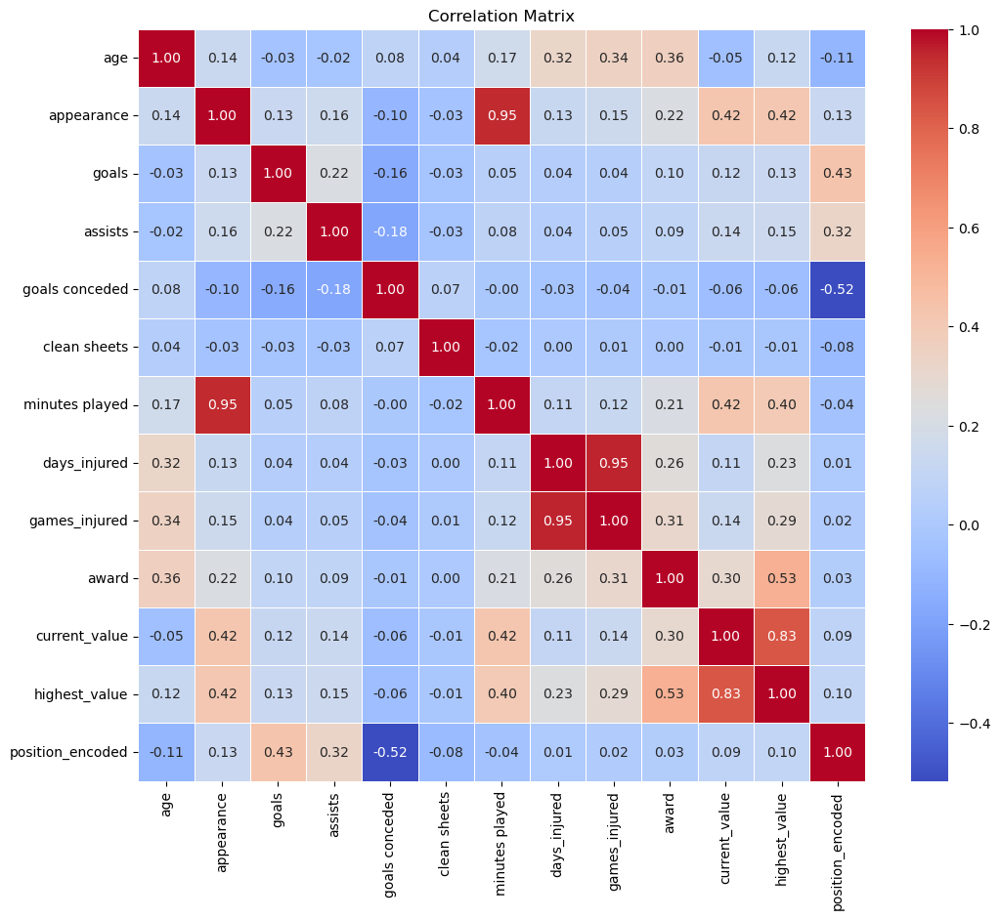

In [318]:
numeric_df = df.select_dtypes(include=[np.number])

# Compute the correlation matrix
correlation_matrix = numeric_df.corr()

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

# We will now check the features that will helps us to predict the target variable based on the data profiling and the heat map

### 1- age

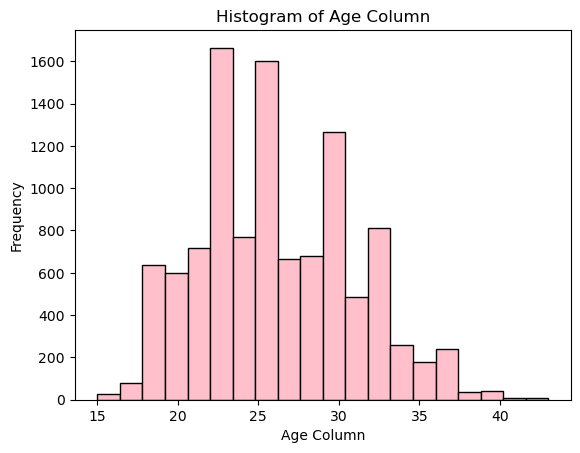

In [319]:
plt.hist(df['age'], bins=20, color='pink', edgecolor='black')
plt.xlabel('Age Column')
plt.ylabel('Frequency')
plt.title('Histogram of Age Column')
plt.show()

In [320]:
print("Upper limit",df['age'].mean() + 3*df['age'].std())
print("Lower limit",df['age'].mean() - 3*df['age'].std()) 


Upper limit 40.37478956969155
Lower limit 11.709017116211372


In [321]:
df.shape

(10754, 16)

In [322]:
df = df[df['age'] <  40.374]
df.shape

(10740, 16)

#### The histogram showed us a normal distribution of the age variable. We can now check the correlation between the features and the age variable.

### 2- team

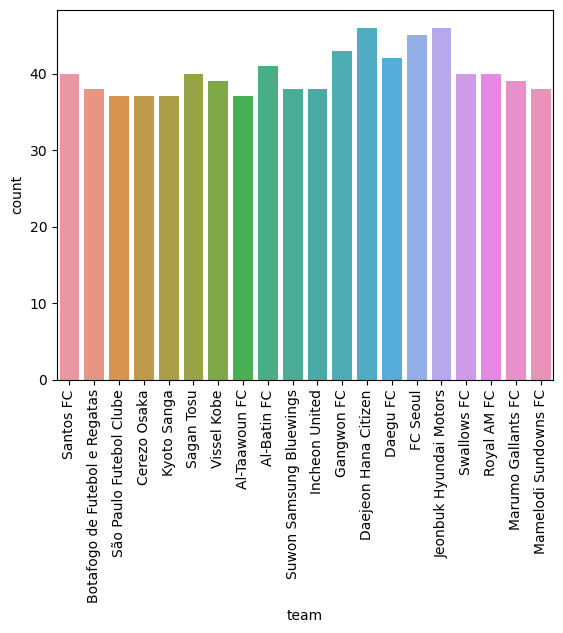

In [323]:
top_categories = df['team'].value_counts().nlargest(20).index
filtered_data = df[df['team'].isin(top_categories)]


sns.countplot(x='team', data=filtered_data)
plt.xticks(rotation=90)
plt.show()

#### The histogram showed us a normal distribution of the team variable. We can now check the correlation between the features and the team variable.

### 3- position

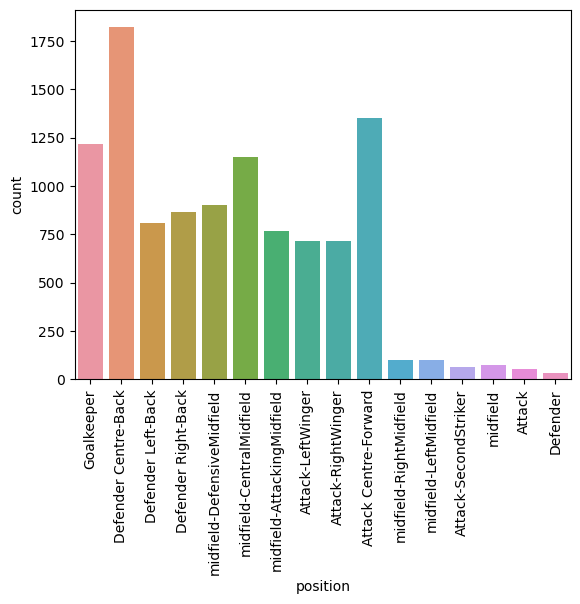

/var/folders/7r/0sbj9qwn2qj4mthzgkw3t4_w0000gq/T/ipykernel_53791/2891500646.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['position_grouped'] = df['position'].replace(categories_to_group, 'Other')


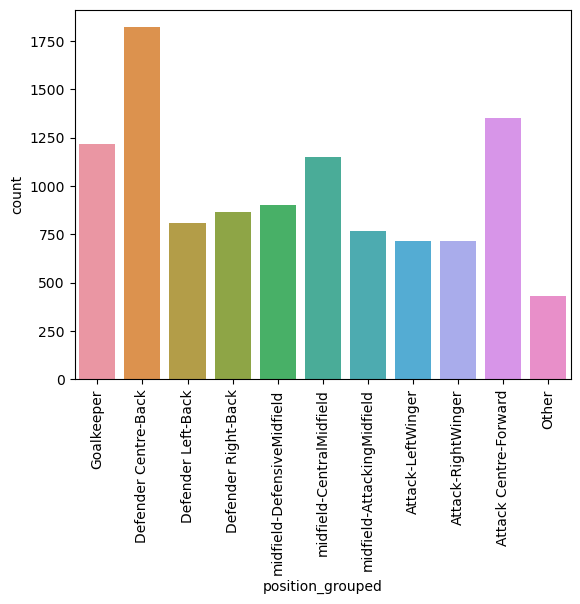

In [324]:
sns.countplot(x='position', data=df)
plt.xticks(rotation=90) 
plt.show()
category_counts = df['position'].value_counts()

categories_to_group = category_counts[category_counts < 500].index

df['position_grouped'] = df['position'].replace(categories_to_group, 'Other')

sns.countplot(x='position_grouped', data=df)
plt.xticks(rotation=90)
plt.show()

#### now postion column is done .

### 4-appearance

In [325]:
df['appearance'].describe()

count    10740.000000
mean        36.426723
std         26.525307
min          0.000000
25%         12.000000
50%         35.000000
75%         59.000000
max        107.000000
Name: appearance, dtype: float64

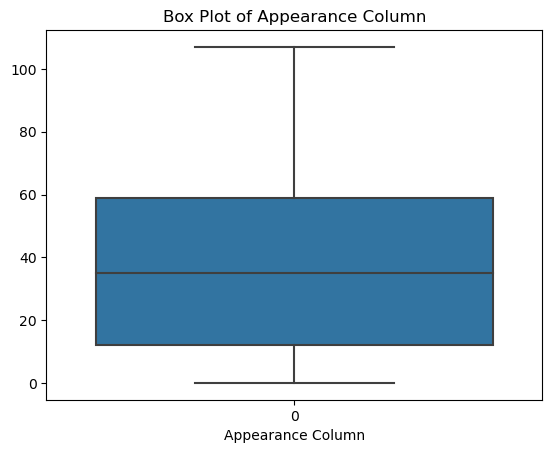

In [326]:
sns.boxplot(df['appearance'])
plt.xlabel('Appearance Column')
plt.title('Box Plot of Appearance Column')
plt.show()

In [327]:
# no outlier on appearnce

## 5 - Minutes Played Column

In [328]:
df['minutes played'].describe()

count    10740.000000
mean      2472.068715
std       2021.751297
min          0.000000
25%        662.000000
50%       2103.500000
75%       3968.250000
max       9510.000000
Name: minutes played, dtype: float64

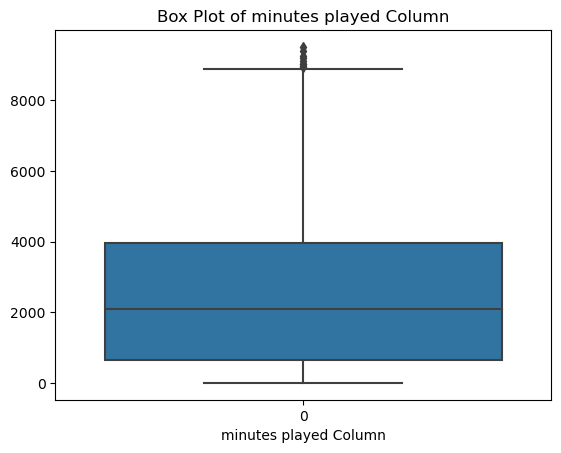

In [329]:
sns.boxplot(df['minutes played'])
plt.xlabel('minutes played Column')
plt.title('Box Plot of minutes played Column')
plt.show()


In [330]:
print("Upper limit",df['minutes played'].mean() + 3*df['minutes played'].std())
print("Lower limit",df['minutes played'].mean() - 3*df['minutes played'].std()) 


Upper limit 8537.322604789215
Lower limit -3593.1851746216175


In [331]:
# so from boxplot we have uper outlier but we dont now specifically where must be cut then from z-score we cut from Upper limit 8535.899194447597

In [332]:
df.shape

(10740, 17)

In [333]:
df = df[df['minutes played'] < 8537.32]
df.shape

(10721, 17)

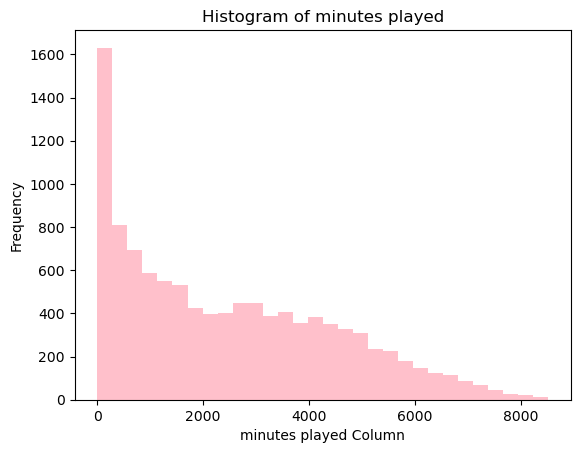

In [334]:
plt.hist(df['minutes played'], bins=30, color='pink')
plt.xlabel('minutes played Column')
plt.ylabel('Frequency')
plt.title('Histogram of minutes played')
plt.show()

In [335]:
df.head(2)

,team,name,position,age,appearance,goals,assists,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,position_grouped
1,Manchester United,Jack Butland,Goalkeeper,30.0,15,0.0,0.0,1.242331,0.207055,1304,510,58,1,1500000,22000000,1,Goalkeeper
2,Manchester United,Tom Heaton,Goalkeeper,37.0,4,0.0,0.0,0.616438,0.924658,292,697,84,4,600000,6000000,1,Goalkeeper


In [336]:
## now we rplce 0 value from minutes played with avrg

In [337]:
non_zero_median = df[df['minutes played'] > 0]['minutes played'].median()

# Replace zeros with the median of non-zero values
df['minutes_played_median'] = df['minutes played'].replace(0, non_zero_median)

In [338]:
df.head(2)

,team,name,position,age,appearance,goals,assists,goals conceded,clean sheets,minutes played,days_injured,games_injured,award,current_value,highest_value,position_encoded,position_grouped,minutes_played_median
1,Manchester United,Jack Butland,Goalkeeper,30.0,15,0.0,0.0,1.242331,0.207055,1304,510,58,1,1500000,22000000,1,Goalkeeper,1304.0
2,Manchester United,Tom Heaton,Goalkeeper,37.0,4,0.0,0.0,0.616438,0.924658,292,697,84,4,600000,6000000,1,Goalkeeper,292.0


 Minutes Played Column is Done 

## 6- Games Injured

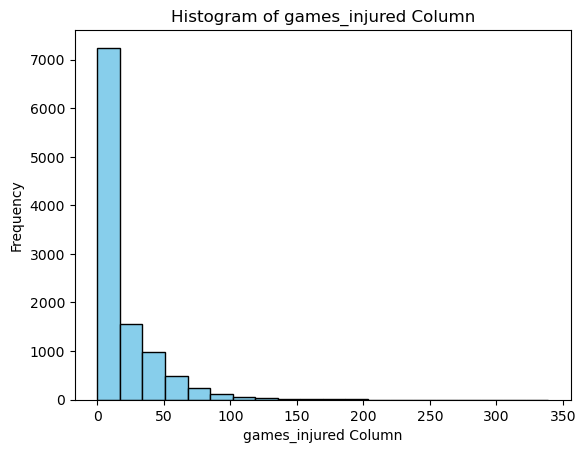

In [339]:
plt.hist(df['games_injured'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('games_injured Column')
plt.ylabel('Frequency')
plt.title('Histogram of games_injured Column')
plt.show()

In [340]:
print("Upper limit",df['games_injured'].mean() + 3*df['games_injured'].std())
print("Lower limit",df['games_injured'].mean() - 3*df['games_injured'].std()) 

Upper limit 85.85857892638039
Lower limit -54.28316618503164


In [341]:
df.shape

(10721, 18)

In [342]:
df = df[df['games_injured'] < 85.85]
df.shape

(10517, 18)

## 7-Award Column

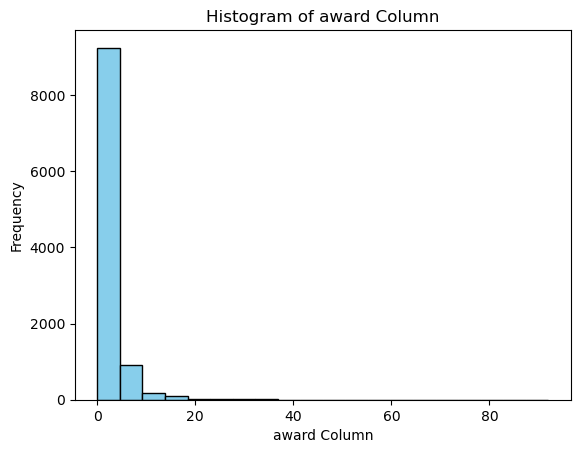

In [343]:
plt.hist(df['award'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('award Column')
plt.ylabel('Frequency')
plt.title('Histogram of award Column')
plt.show()


In [344]:
print("Upper limit",df['award'].mean() + 3*df['award'].std())
print("Lower limit",df['award'].mean() - 3*df['award'].std()) 


Upper limit 12.833438631236167
Lower limit -9.042813928374134


In [345]:
df.shape

(10517, 18)

In [346]:
df = df[df['award'] < 12.84]
df.shape

(10316, 18)

## 8- Current Value Column

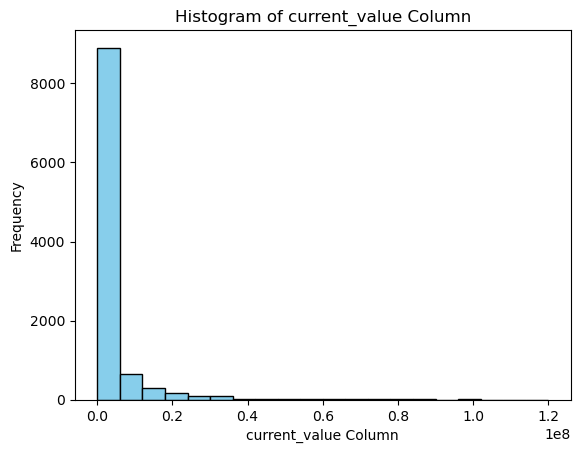

In [347]:
plt.hist(df['current_value'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('current_value Column')
plt.ylabel('Frequency')
plt.title('Histogram of current_value Column')
plt.show()


In [348]:
print("Upper limit",df['current_value'].mean() + 3*df['current_value'].std())
print("Lower limit",df['current_value'].mean() - 3*df['current_value'].std()) 

Upper limit 27121481.782249954
Lower limit -20509615.748903695


In [349]:
df.shape

(10316, 18)

In [350]:
df = df[df['current_value'] < 27121481.78]
df.shape

(10101, 18)

## 9- goles

In [351]:
print("Upper limit",df['goals'].mean() + 3*df['goals'].std())
print("Lower limit",df['goals'].mean() - 3*df['goals'].std()) 

Upper limit 0.8188653385263002
Lower limit -0.5765115580746617


In [352]:
df.shape

(10101, 18)

In [353]:
df = df[df['goals'] < 0.57106]
df.shape

(9792, 18)

## 10- assists

In [354]:
print("Upper limit",df['assists'].mean() + 3*df['assists'].std())
print("Lower limit",df['assists'].mean() - 3*df['assists'].std()) 

Upper limit 0.5066146319869793
Lower limit -0.34139554841692205


In [355]:
df = df[df['assists'] <  0.363353]
df.shape

(9529, 18)

In [356]:
df.to_csv("data.csv")